In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
import numpy as np
import multiprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, classification_report
import shap

In [2]:
# Load the dataset
df = pd.read_csv("bank-full.csv", sep=";")

##  EDA

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [4]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


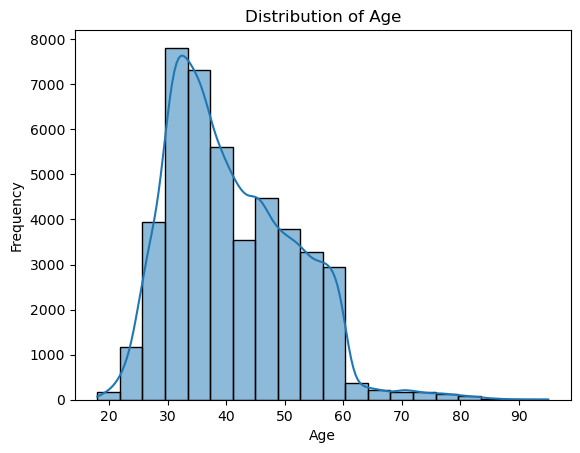

In [5]:
# Distribution of Age
sns.histplot(df['age'], bins=20, kde=True)
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

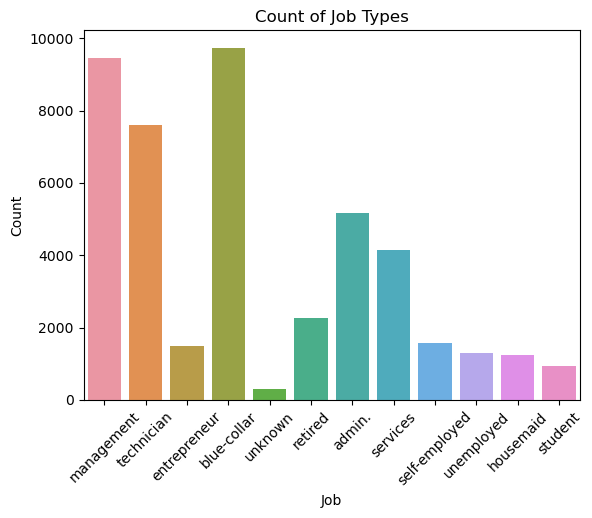

In [6]:
sns.countplot(x='job', data=df)
plt.title('Count of Job Types')
plt.xlabel('Job')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

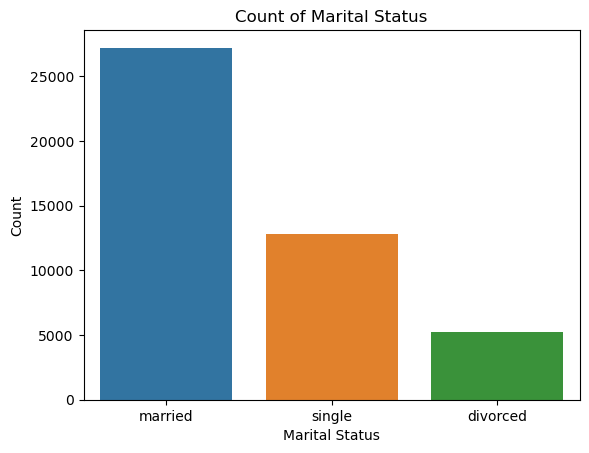

In [7]:
sns.countplot(x='marital', data=df)
plt.title('Count of Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.show()


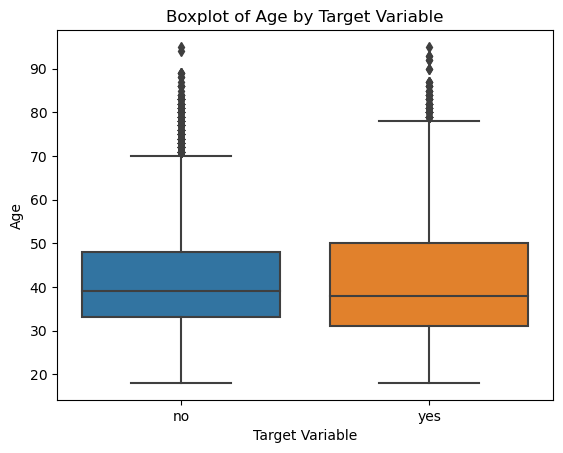

In [8]:
sns.boxplot(x='y', y='age', data=df)
plt.title('Boxplot of Age by Target Variable')
plt.xlabel('Target Variable')
plt.ylabel('Age')
plt.show()


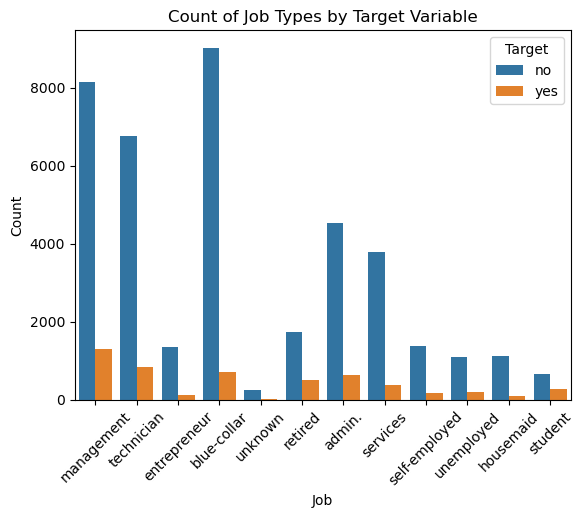

In [9]:
sns.countplot(x='job', hue='y', data=df)
plt.title('Count of Job Types by Target Variable')
plt.xlabel('Job')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Target', loc='upper right')
plt.show()


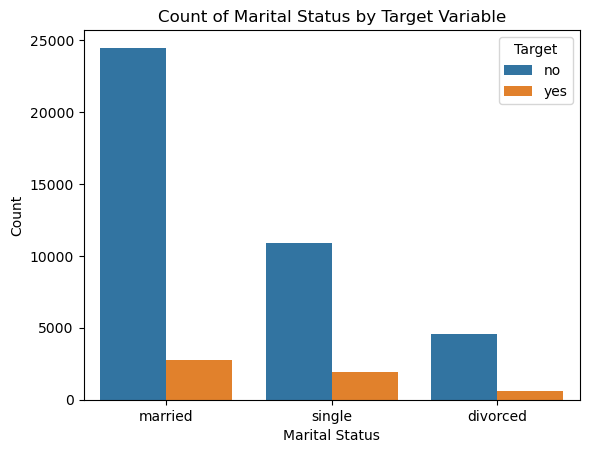

In [10]:
sns.countplot(x='marital', hue='y', data=df)
plt.title('Count of Marital Status by Target Variable')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.legend(title='Target', loc='upper right')
plt.show()


/Users/user/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


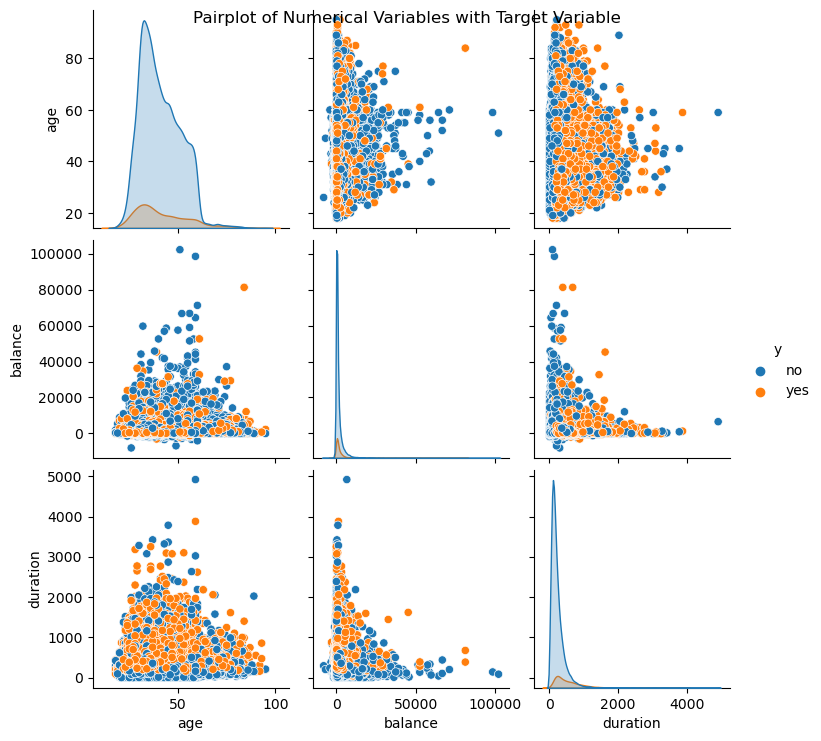

In [11]:
sns.pairplot(df[['age', 'balance', 'duration', 'y']], hue='y', diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables with Target Variable')
plt.show()


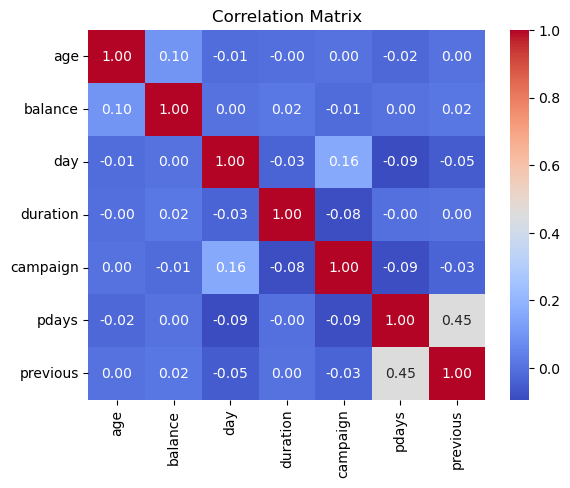

In [12]:
# Select only numeric columns for correlation matrix
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
correlation_matrix = df[numeric_columns].corr()

# Plot the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

## MODEL

In [13]:
# Transform categorical variables into dummy variables
df = pd.get_dummies(df, drop_first=True)

In [14]:
# Split features and target variable
X = df.drop('y_yes', axis=1)
y = df['y_yes']

In [15]:
# Split dataset into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1502)

In [16]:
# Define cross-validation strategy
tune_control = KFold(n_splits=5, shuffle=True, random_state=1502)

In [17]:
tune_grid = {'learning_rate': [0.05, 0.3],
               'max_depth': range(2, 9, 2),
               'colsample_bytree': [0.5, 1],
               'subsample': [1],
               'min_child_weight': [1],
               'gamma': [0], 
               'random_state': [1502],
               'n_estimators': range(200, 2000, 200),
               'booster': ["gbtree"]}    


In [18]:
# Initialize XGBoost classifier
classifier = XGBClassifier(objective="binary:logistic", eval_metric='auc',
                           early_stopping_rounds=100, random_state=1502)

In [19]:
# Grid Search CV for hyperparameter tuning
grid_search = GridSearchCV(estimator=classifier, param_grid=tune_grid, scoring="roc_auc",
                           n_jobs=multiprocessing.cpu_count(), cv=tune_control, verbose=5)

In [20]:
# Hyperparameter tuning with evaluation parameters
tune_model = grid_search.fit(X=X_train, y=y_train, eval_set=[(X_test, y_test)])


Fitting 5 folds for each of 144 candidates, totalling 720 fits
[0]	validation_0-auc:0.60440
[0]	validation_0-auc:0.60453
[0]	validation_0-auc:0.60453
[0]	validation_0-auc:0.60453
[1]	validation_0-auc:0.68216
[1]	validation_0-auc:0.68163
[1]	validation_0-auc:0.68229
[1]	validation_0-auc:0.68222
[2]	validation_0-auc:0.83196
[2]	validation_0-auc:0.84984
[2]	validation_0-auc:0.85275
[2]	validation_0-auc:0.84166
[3]	validation_0-auc:0.83463
[3]	validation_0-auc:0.84309
[3]	validation_0-auc:0.83685
[4]	validation_0-auc:0.84050
[3]	validation_0-auc:0.84414
[4]	validation_0-auc:0.85177
[4]	validation_0-auc:0.84699
[4]	validation_0-auc:0.85294
[5]	validation_0-auc:0.84140
[5]	validation_0-auc:0.85021
[5]	validation_0-auc:0.84429
[5]	validation_0-auc:0.85108
[6]	validation_0-auc:0.84155
[6]	validation_0-auc:0.85463
[6]	validation_0-auc:0.85646
[7]	validation_0-auc:0.84453
[6]	validation_0-auc:0.86035
[7]	validation_0-auc:0.85479
[7]	validation_0-auc:0.85290
[8]	validation_0-auc:0.84691
[7]	valid

In [23]:
# Get the top 2 best parameters and scores
results = tune_model.cv_results_
top_n = 2 

# Sort the results by mean_test_score in descending order
top_results_indices = np.argsort(results['mean_test_score'])[::-1][:top_n]

print("Top", top_n, "Best Parameters:")
for idx in top_results_indices:
    params = {key[:]: results['params'][idx][key] for key in results['params'][idx]}
    print("Parameters:", params)
    print("Mean ROC-AUC Score:", results['mean_test_score'][idx])
    print()


Top 2 Best Parameters:
Parameters: {'booster': 'gbtree', 'colsample_bytree': 0.5, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 200, 'random_state': 1502, 'subsample': 1}
Mean ROC-AUC Score: 0.9357653664394998

Parameters: {'booster': 'gbtree', 'colsample_bytree': 0.5, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 400, 'random_state': 1502, 'subsample': 1}
Mean ROC-AUC Score: 0.9355814428020572



In [28]:
best_params, best_score = tune_model.best_params_, tune_model.best_score_

In [29]:
# Initialize XGBoost model with the best parameters
best_classifier = XGBClassifier(**best_params)

In [30]:
# Train XGBoost model
best_classifier.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=1502, ...)

In [31]:
# Make predictions
predictions = best_classifier.predict(X_test)

In [34]:
# Calculate and print confusion matrix and classification report
conf_matrix = confusion_matrix(y_test, predictions)
print("Confusion Matrix:")
print(conf_matrix)
report = classification_report(y_test, predictions)
print("Classification Report:")
print(report)

Confusion Matrix:
[[7672  270]
 [ 600  501]]
Classification Report:
              precision    recall  f1-score   support

       False       0.93      0.97      0.95      7942
        True       0.65      0.46      0.54      1101

    accuracy                           0.90      9043
   macro avg       0.79      0.71      0.74      9043
weighted avg       0.89      0.90      0.90      9043



<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

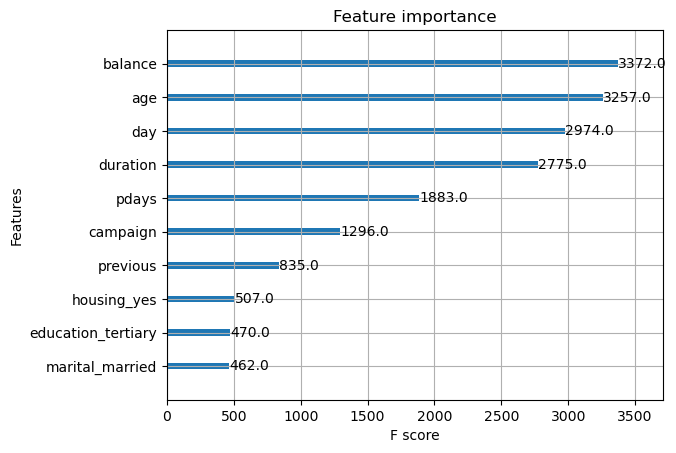

In [35]:
# Plot feature importances
xgb.plot_importance(best_classifier, max_num_features=10)

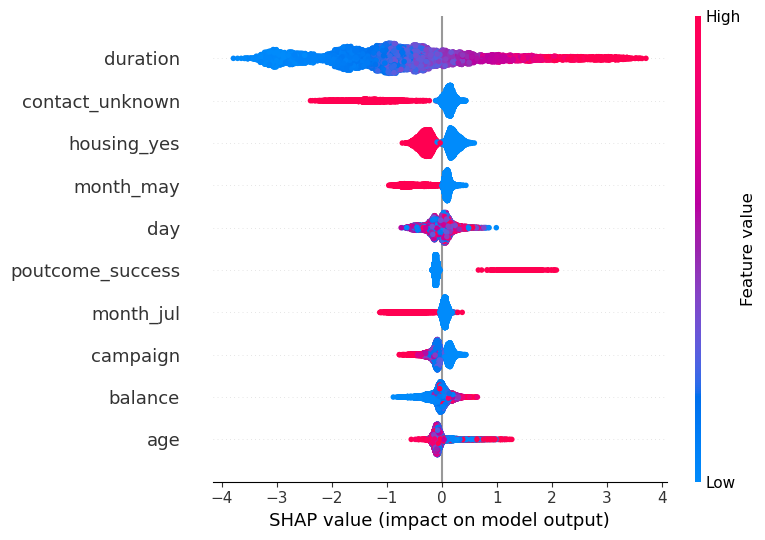

In [36]:
# Plot SHAP summary plot
explainer = shap.TreeExplainer(best_classifier)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, max_display=10)